In [31]:
%matplotlib inline
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# User config.

In [32]:
data_dir = '/Users/misha/data'  # e.g. '/home/ec2-user/misha/bdd100k_demo_data'

# Download data

### Download images from S3 storage

In [3]:
import os

import boto3

s3 = boto3.resource('s3', region_name='il-central-1')
bucket = s3.Bucket('hirundo-demo-data')
os.makedirs(data_dir, exist_ok=True)
filename  = 'demo_images.zip'
filepath = os.path.join(data_dir, filename)
bucket.download_file('BDD100K/demo_images.zip', filepath)

### Unzip images

In [4]:
import zipfile

with zipfile.ZipFile(filepath, 'r') as zip_ref:
    zip_ref.extractall(data_dir)

# Download high self-influence samples

In [40]:
import pandas as pd
from clearml import Task

task = Task.get_task('4567342d960545ed92c7a8ea28cc81d3')
filepath = task.artifacts['topk_self_influence_train_samples'].get_local_copy(force_download=True)
self_influence_samples = pd.read_csv(filepath)

2024-03-14 12:42:20,797 - clearml.storage - INFO - Downloading: 5.00MB / 6.37MB @ 6.01MBs from http://172.31.23.240:8081/Influence%20Research/BDD100K%20Classifier.4567342d960545ed92c7a8ea28cc81d3/artifacts/topk_self_influence_train_samples/topk_self_influence_train_samples.csv.gz
2024-03-14 12:42:21,031 - clearml.storage - INFO - Downloading: 6.37MB / 6.37MB @ 5.86MBs from http://172.31.23.240:8081/Influence%20Research/BDD100K%20Classifier.4567342d960545ed92c7a8ea28cc81d3/artifacts/topk_self_influence_train_samples/topk_self_influence_train_samples.csv.gz
2024-03-14 12:42:21,037 - clearml.storage - INFO - Downloaded 6.37 MB successfully from http://172.31.23.240:8081/Influence%20Research/BDD100K%20Classifier.4567342d960545ed92c7a8ea28cc81d3/artifacts/topk_self_influence_train_samples/topk_self_influence_train_samples.csv.gz , saved to /Users/misha/.clearml/cache/storage_manager/global/c00c4d96772d0426ea9c6dc0b0bdfb3e.topk_self_influence_train_samples.csv.gz


In [41]:
classes = [
            "none",
            "bicycle",
            "bus",
            "car",
            "motorcycle",
            "other person",
            "other vehicle",
            "pedestrian",
            "rider",
            "traffic light",
            "traffic sign",
            "trailer",
            "train",
            "truck",
        ]

# Filter top-k samples

In [44]:
from kneed import KneeLocator

kn = KneeLocator(range(self_influence_samples.shape[0]), self_influence_samples.self_influence, curve='convex', direction='decreasing')
self_influence_samples = self_influence_samples[:kn.knee]

# Add Relevant Metadata to samples and Save

In [45]:
self_influence_samples['predicted_class'] = self_influence_samples['pred'].apply(lambda x: classes[int(x)])
self_influence_samples.head()

,Unnamed: 0,frame_idx,box_idx,image_path,label,x1,y1,x2,y2,idx,self_influence,pred,conf,predicted_class
0,99914,5344,2,/home/ec2-user/open_source_data/bdd100k/images...,car,420,186,446,212,99914,13.735131,9.0,0.999234,traffic light
1,141310,7593,20,/home/ec2-user/open_source_data/bdd100k/images...,traffic light,332,172,373,222,141310,13.453860,10.0,0.705040,traffic sign
2,155163,8344,9,/home/ec2-user/open_source_data/bdd100k/images...,traffic light,376,270,392,290,155163,13.384315,10.0,0.990755,traffic sign
3,141309,7593,19,/home/ec2-user/open_source_data/bdd100k/images...,traffic light,322,169,380,227,141309,13.035690,10.0,0.693532,traffic sign
4,53310,2854,7,/home/ec2-user/open_source_data/bdd100k/images...,car,896,311,944,356,53310,13.022880,9.0,0.999834,traffic light


In [24]:
df = self_influence_samples.groupby('frame_idx')['box_idx'].count().reset_index()
df.columns = ['frame_idx', 'num_boxes']
df.head()

,frame_idx,num_boxes
0,0,1
1,2,1
2,7,2
3,22,1
4,29,1


In [25]:
df = df.sort_values(by='num_boxes', ascending=False)
df.head()

,frame_idx,num_boxes
341,3234,17
257,2460,10
925,8485,7
841,7756,6
751,7004,6


In [29]:
df['is_filter'] = (df['num_boxes'] == 1) & (df['frame_idx'].isin(self_influence_samples.loc[self_influence_samples['label'] == self_influence_samples['predicted_class'], 'frame_idx']))
df.loc[df['is_filter'] == True].count()

frame_idx    210
num_boxes    210
is_filter    210
dtype: int64

In [30]:
df.to_csv('images_metadata.csv', index=False)


# Plot images

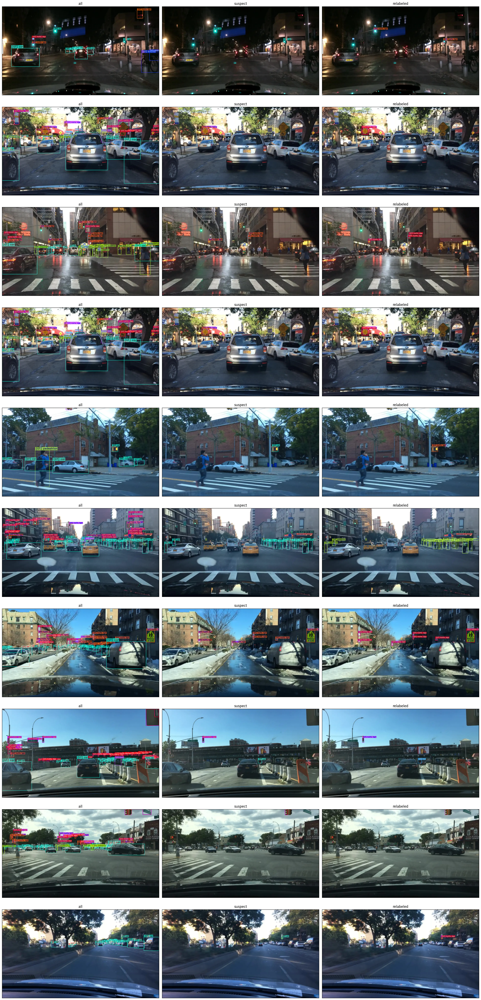

In [9]:
from matplotlib import pyplot as plt
from PIL import ImageFile
import os

ImageFile.LOAD_TRUNCATED_IMAGES = True

topk = 10  # chose num. of samples to display

fig, axs = plt.subplots(nrows=topk, ncols=3, figsize=(24, 5 * topk), subplot_kw={'xticks': [], 'yticks': []})
for row,frame_idx  in enumerate(self_influence_samples.frame_idx[:topk]):
    for col, img_type in enumerate(['all', 'suspect', 'relabeled']):
        img = plt.imread(os.path.join(data_dir, 'demo_images_webp', f'{img_type}_bboxes/{frame_idx}.webp'))
        axs[row, col].imshow(img)
        axs[row, col].set_title(img_type)
plt.tight_layout()
plt.show()